In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import shutil
import cv2
import os
from tqdm import tqdm

In [2]:
#%pip install ultralytics
#%pip install ipywidgets

import ultralytics
ultralytics.checks()

Ultralytics 8.3.5 🚀 Python-3.12.3 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 SUPER, 12282MiB)
Setup complete ✅ (20 CPUs, 15.5 GB RAM, 90.6/1006.9 GB disk)


In [3]:
classes = np.array(['A10','A400M','AG600','AV8B',
        'B1','B2','B52','Be200',
        'C130','C2','C17','C5','E2','E7','EF2000',
        'F117','F14','F15','F16','F18','F22','F35','F4',
        'JAS39','MQ9','Mig31','Mirage2000','P3','RQ4','Rafale',
        'SR71','Su34','Su57',
        'Tu160','Tu95','Tornado',
        'U2','US2', 'V22','XB70','YF23','Vulcan','J20']
)
print(len(classes))

43


In [4]:
csv_paths = glob.glob('military_aircraft/dataset/*.csv')
jpg_paths = glob.glob('military_aircraft/dataset/*.jpg')
csv_paths.sort()
jpg_paths.sort()
print('number of images:',len(csv_paths))


os.makedirs('datasets/kaggle/working/resdata/data/train/images', exist_ok=True)
os.makedirs('datasets/kaggle/working/resdata/data/train/labels', exist_ok=True)

os.makedirs('datasets/kaggle/working/resdata/data/valid/images', exist_ok=True)
os.makedirs('datasets/kaggle/working/resdata/data/valid/labels', exist_ok=True)

os.makedirs('datasets/kaggle/working/resdata/data/test/images', exist_ok=True)
os.makedirs('datasets/kaggle/working/resdata/data/test/labels', exist_ok=True)

number of images: 17733


In [5]:
# split
for i, (csv_path, jpg_path) in enumerate(tqdm(zip(csv_paths, jpg_paths))):
    annotations = np.array(pd.read_csv(csv_path))
    
    if os.path.basename(csv_path)[0] in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'a', 'b', 'f']:
        continue
    elif os.path.basename(csv_path)[0] in ['c', 'd', 'e']:
        jpg_file_path = 'datasets/kaggle/working/resdata/data/valid/images/' + os.path.basename(jpg_path)
        txt_file_path = 'datasets/kaggle/working/resdata/data/valid/labels/' + os.path.basename(csv_path)[:-4]+'.txt'
        shutil.copy(jpg_path, jpg_file_path)
    else:
        continue
    
    with open(txt_file_path, mode='w') as f:
        try:
            for annotation in annotations:
                width = annotation[1]
                height = annotation[2]
                class_name = annotation[3]
                xmin = annotation[4]
                ymin = annotation[5]
                xmax = annotation[6]
                ymax = annotation[7]
                x_center = 0.5*(xmin+xmax)
                y_center = 0.5*(ymin+ymax)
                b_width = xmax - xmin
                b_height= ymax - ymin
                class_num = np.where(classes==class_name)[0][0]
                output_string = '{} {} {} {} {}\n'.format(class_num,
                                                        x_center/width,
                                                        y_center/height,
                                                        b_width/width,
                                                        b_height/height)
                f.write(output_string)
        except:
            pass
          #  print(txt_file_path)
            

print('test:',len(glob.glob('datasets/kaggle/working/resdata/data/test/labels/*.txt')))
print('valid:',len(glob.glob('datasets/kaggle/working/resdata/data/valid/labels/*.txt')))
print('train',len(glob.glob('datasets/kaggle/working/resdata/data/train/labels/*.txt')))

17733it [00:12, 1403.49it/s]

test: 0
valid: 3305
train 0


In [11]:
classes_string = ', '.join([f'"{c}"' for c in classes])
with open('mad.yaml', mode='w') as f:
    yaml_string='train: kaggle/working/resdata/data/train\n'\
              + 'val: kaggle/working/resdata/data/valid\n'\
              + 'test: kaggle/working/resdata/data/test\n'\
              + f'nc: {len(classes)}\n'\
              + f'names: [{classes_string}]'
    f.write(yaml_string)
print(yaml_string)

train: kaggle/working/resdata/data/train
val: kaggle/working/resdata/data/valid
test: kaggle/working/resdata/data/test
nc: 43
names: ["A10", "A400M", "AG600", "AV8B", "B1", "B2", "B52", "Be200", "C130", "C2", "C17", "C5", "E2", "E7", "EF2000", "F117", "F14", "F15", "F16", "F18", "F22", "F35", "F4", "JAS39", "MQ9", "Mig31", "Mirage2000", "P3", "RQ4", "Rafale", "SR71", "Su34", "Su57", "Tu160", "Tu95", "Tornado", "U2", "US2", "V22", "XB70", "YF23", "Vulcan", "J20"]


In [12]:
# Validate YOLOv8n on COCO8 val
!yolo val \
model='yolov7/yolov8-m-best.pt' \
data='mad.yaml'\
augment \
batch=8 \
imgsz=1536#1280

Ultralytics 8.3.5 🚀 Python-3.12.3 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 SUPER, 12282MiB)
YOLOv8m summary (fused): 218 layers, 25,864,657 parameters, 0 gradients, 78.8 GFLOPs
100%|████████████████████████████████████████| 755k/755k [00:00<00:00, 7.65MB/s]
val: Scanning /home/andre/workspace/military-detection/datasets/kaggle/working/r
val: New cache created: /home/andre/workspace/military-detection/datasets/kaggle/working/resdata/data/valid/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       3305       4614      0.822      0.801      0.848      0.787
                   A10         66        104      0.827      0.788      0.865      0.787
                 A400M         62         96      0.902      0.844        0.9      0.848
                 AG600         45         53       0.92      0.874      0.946      0.896
                  AV8B         59        105      0.919      0.848      0.896      0.866
     

In [15]:
!ls runs/detect/val6

F1_curve.png  confusion_matrix.png	       val_batch1_labels.jpg
PR_curve.png  confusion_matrix_normalized.png  val_batch1_pred.jpg
P_curve.png   val_batch0_labels.jpg	       val_batch2_labels.jpg
R_curve.png   val_batch0_pred.jpg	       val_batch2_pred.jpg


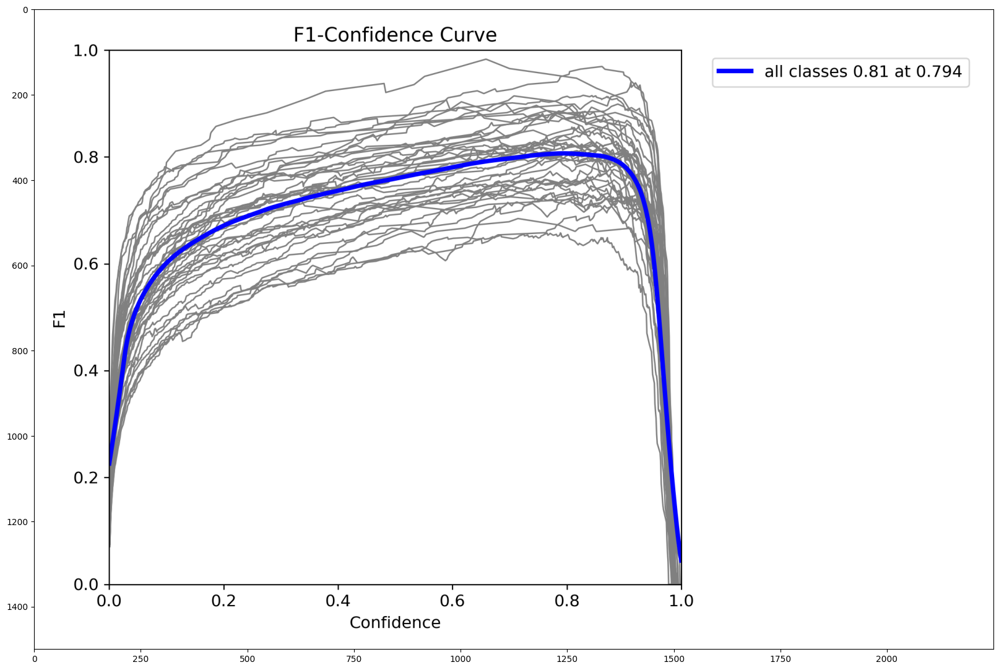

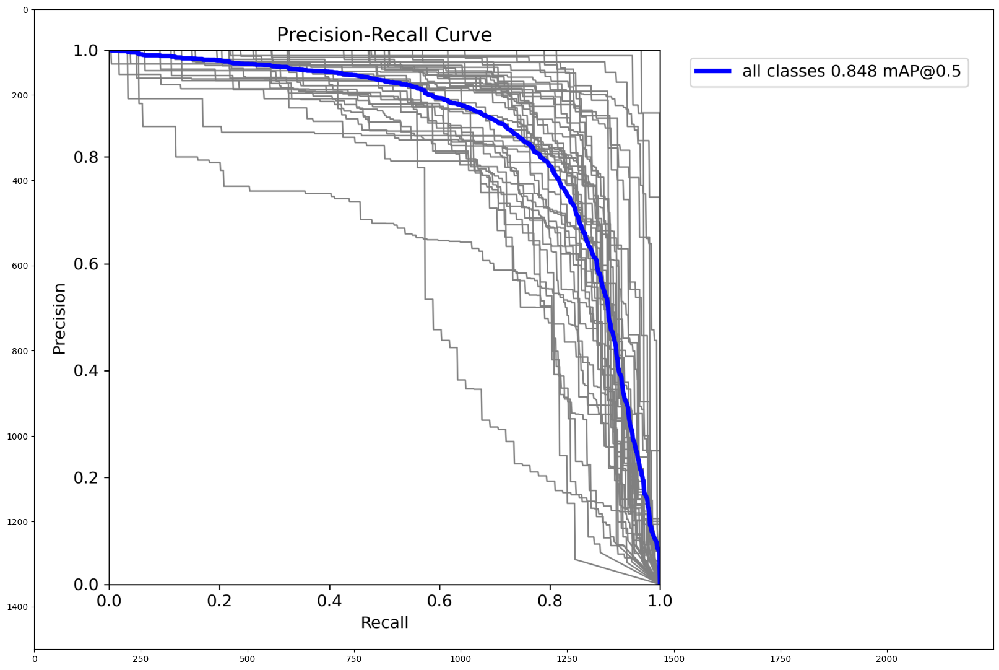

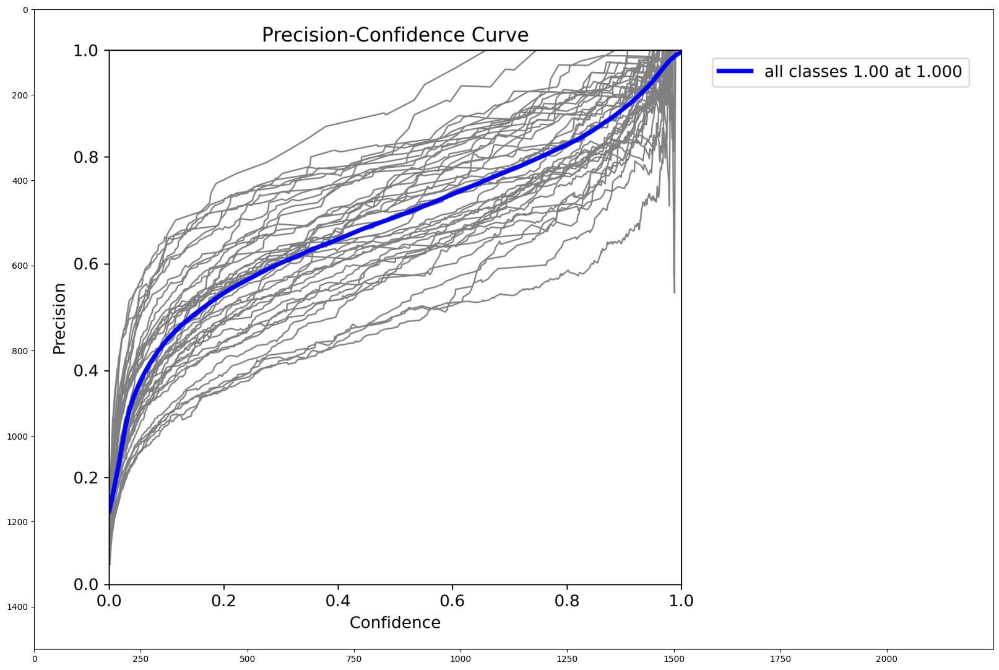

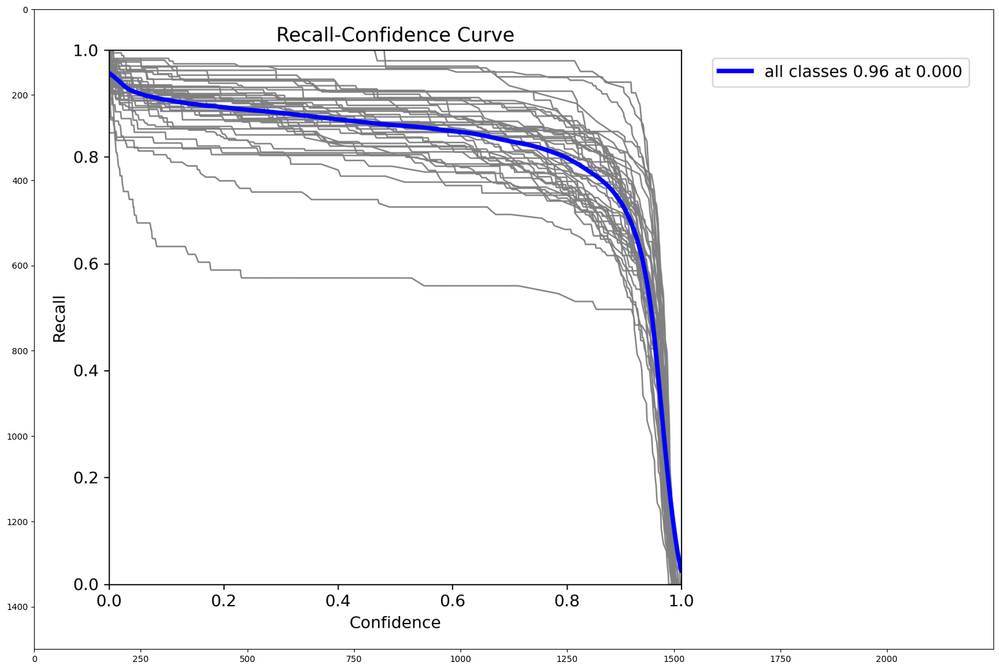

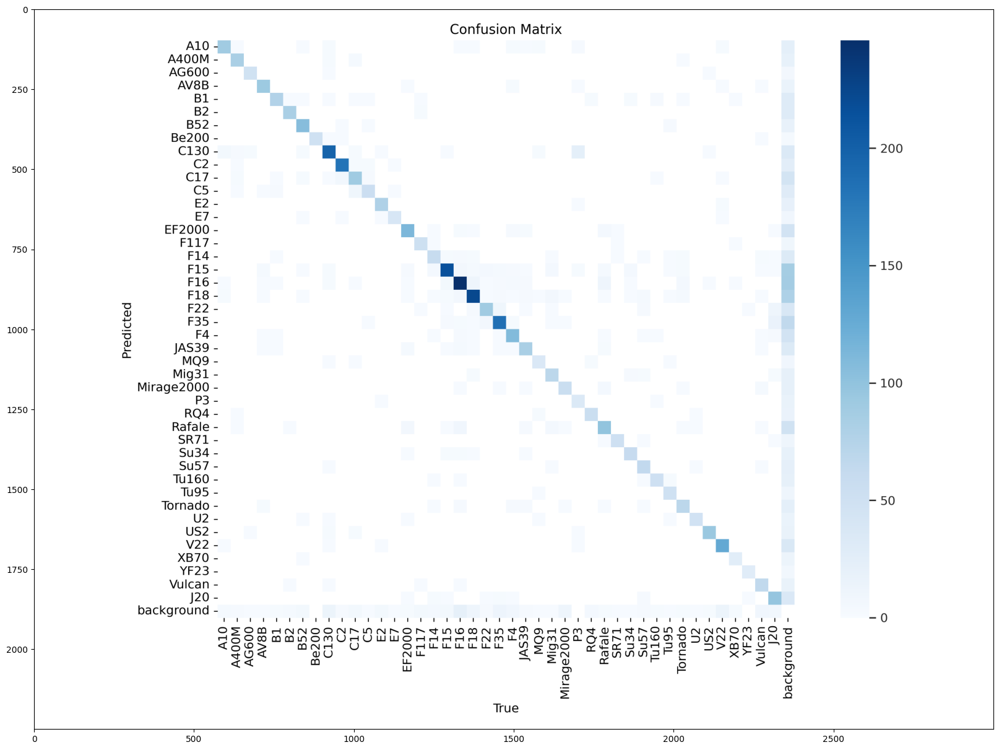

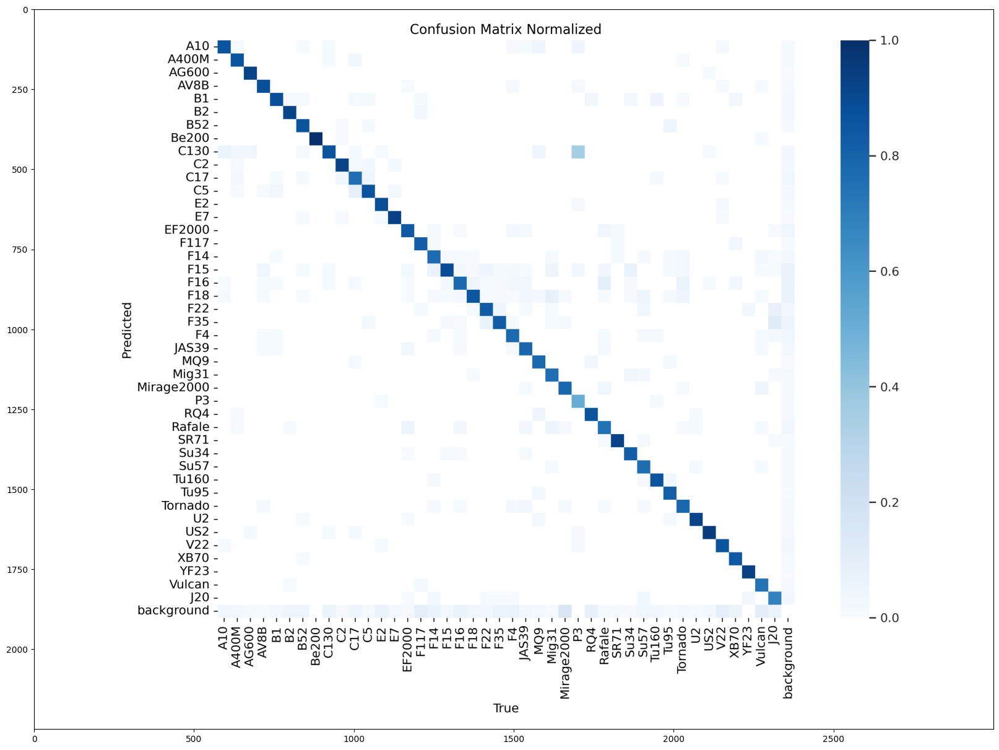

In [16]:
for path in sorted(glob.glob('runs/detect/val6/*.png')):
    image = cv2.imread(path)[:,:,::-1]
    plt.figure(figsize=(20,20))
    plt.imshow(image)
    plt.show()

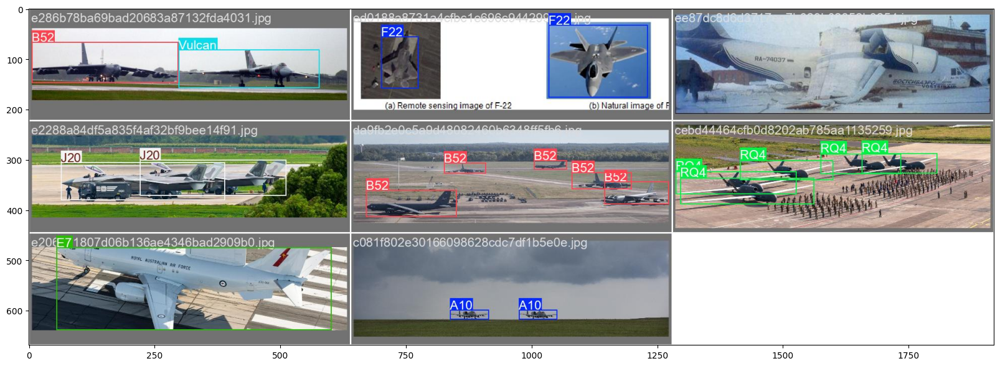

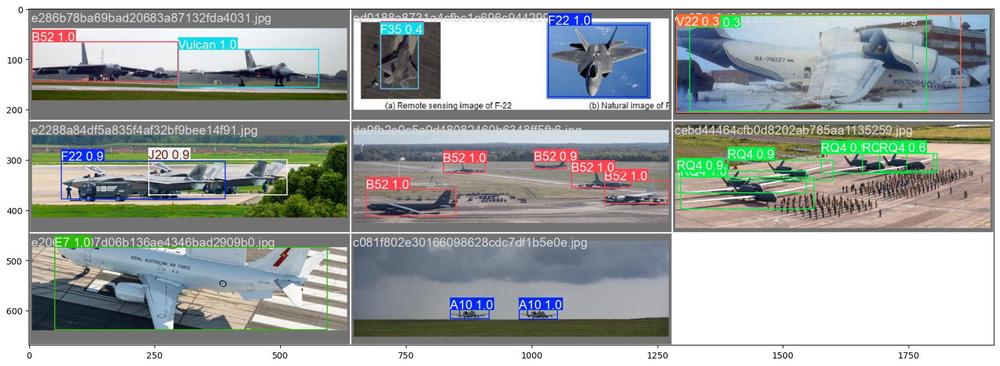

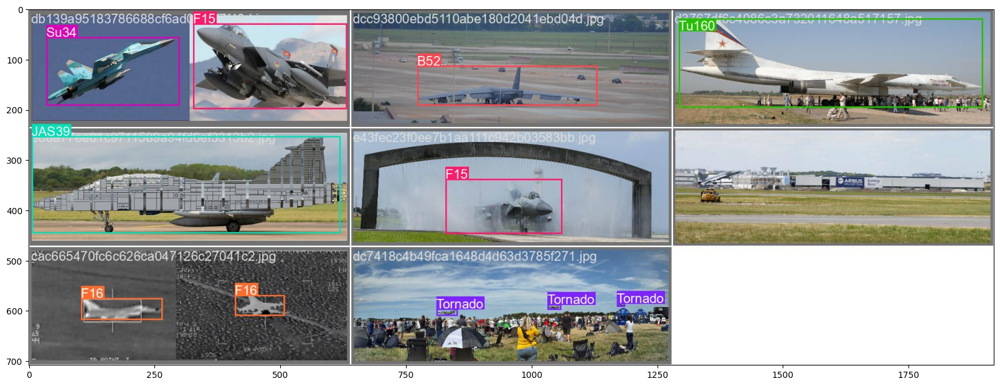

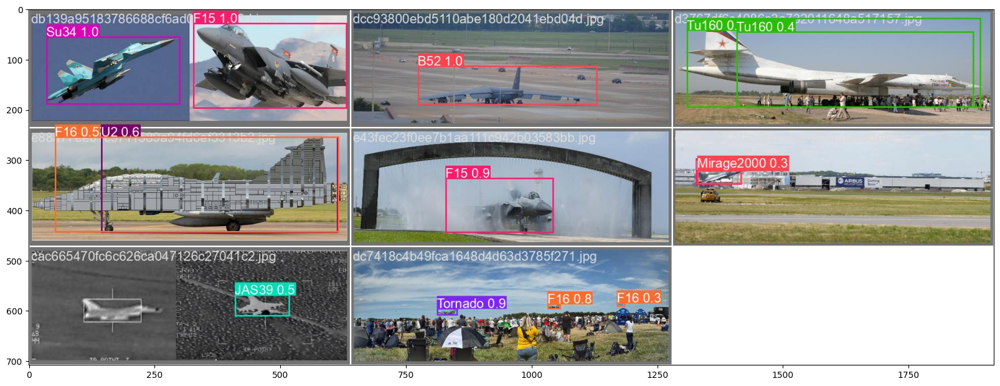

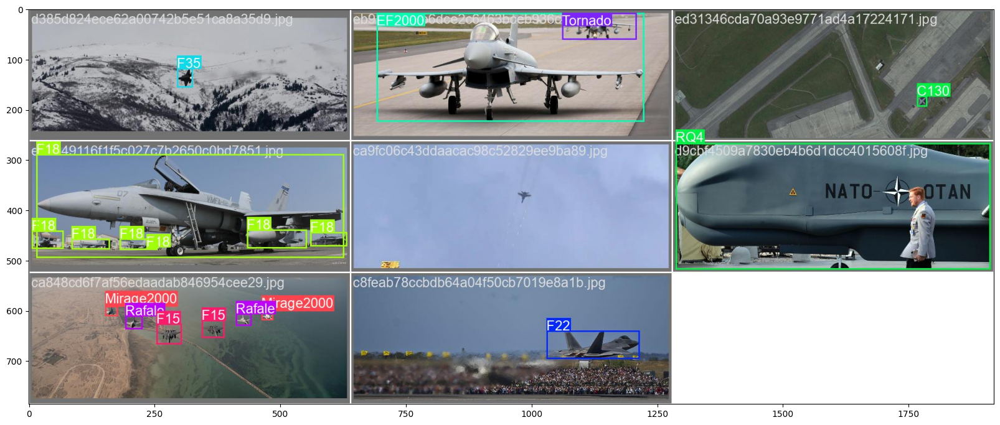

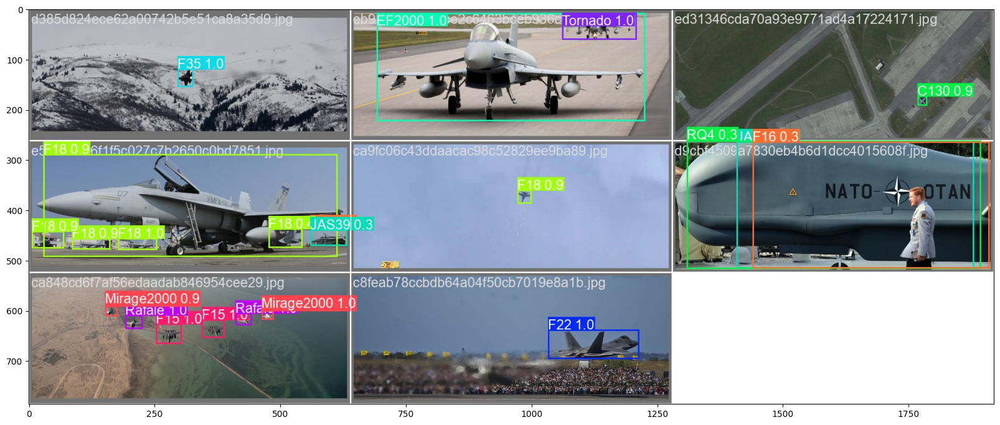

In [17]:
for path in sorted(glob.glob('runs/detect/val6/*.jpg')):
    image = cv2.imread(path)[:,:,::-1]
    plt.figure(figsize=(20,20))
    plt.imshow(image)
    plt.show()